# Introduction

The data were collected from the Taiwan Economic Journal for the years 1999 to 2009. Company bankruptcy was defined based on the business regulations of the Taiwan Stock Exchange. Data source: [Company Bankruptcy Prediction](https://www.kaggle.com/datasets/fedesoriano/company-bankruptcy-prediction)

## Metadata

Version 2: Updated column names and description to make the data easier to understand.

* Bankrupt?: Class label
* ROA(C) before interest and depreciation before interest: Return On Total Assets(C)
* ROA(A) before interest and % after tax: Return On Total Assets(A)
* ROA(B) before interest and depreciation after tax: Return On Total Assets(B)
* Operating Gross Margin: Gross Profit/Net Sales
* Realized Sales Gross Margin: Realized Gross Profit/Net Sales
* Operating Profit Rate: Operating Income/Net Sales
* Pre-tax net Interest Rate: Pre-Tax Income/Net Sales
* After-tax net Interest Rate: Net Income/Net Sales
* Non-industry income and expenditure/revenue: Net Non-operating Income Ratio
* Continuous interest rate (after tax): Net Income-Exclude Disposal Gain or Loss/Net Sales
* Operating Expense Rate: Operating Expenses/Net Sales
* Research and development expense rate: (Research and Development Expenses)/Net Sales
* Cash flow rate: Cash Flow from Operating/Current Liabilities
* Interest-bearing debt interest rate: Interest-bearing Debt/Equity
* Tax rate (A): Effective Tax Rate
* Net Value Per Share (B): Book Value Per Share(B)
* Net Value Per Share (A): Book Value Per Share(A)
* Net Value Per Share (C): Book Value Per Share(C)
* Persistent EPS in the Last Four Seasons: EPS-Net Income
* Cash Flow Per Share
* Revenue Per Share (Yuan ¥): Sales Per Share
* Operating Profit Per Share (Yuan ¥): Operating Income Per Share
* Per Share Net profit before tax (Yuan ¥): Pretax Income Per Share
* Realized Sales Gross Profit Growth Rate
* Operating Profit Growth Rate: Operating Income Growth
* After-tax Net Profit Growth Rate: Net Income Growth
* Regular Net Profit Growth Rate: Continuing Operating Income after Tax Growth
* Continuous Net Profit Growth Rate: Net Income-Excluding Disposal Gain or Loss Growth
* Total Asset Growth Rate: Total Asset Growth
* Net Value Growth Rate: Total Equity Growth
* Total Asset Return Growth Rate Ratio: Return on Total Asset Growth
* Cash Reinvestment %: Cash Reinvestment Ratio
* Current Ratio
* Quick Ratio: Acid Test
* Interest Expense Ratio: Interest Expenses/Total Revenue
* Total debt/Total net worth: Total Liability/Equity Ratio
* Debt ratio %: Liability/Total Assets
* Net worth/Assets: Equity/Total Assets
* Long-term fund suitability ratio (A): (Long-term Liability+Equity)/Fixed Assets
* Borrowing dependency: Cost of Interest-bearing Debt
* Contingent liabilities/Net worth: Contingent Liability/Equity
* Operating profit/Paid-in capital: Operating Income/Capital
* Net profit before tax/Paid-in capital: Pretax Income/Capital
* Inventory and accounts receivable/Net value: (Inventory+Accounts Receivables)/Equity
* Total Asset Turnover
* Accounts Receivable Turnover
* Average Collection Days: Days Receivable Outstanding
* Inventory Turnover Rate (times)
* Fixed Assets Turnover Frequency
* Net Worth Turnover Rate (times): Equity Turnover
* Revenue per person: Sales Per Employee
* Operating profit per person: Operation Income Per Employee
* Allocation rate per person: Fixed Assets Per Employee
* Working Capital to Total Assets
* Quick Assets/Total Assets
* Current Assets/Total Assets
* Cash/Total Assets
* Quick Assets/Current Liability
* Cash/Current Liability
* Current Liability to Assets
* Operating Funds to Liability
* Inventory/Working Capital
* Inventory/Current Liability
* Current Liabilities/Liability
* Working Capital/Equity
* Current Liabilities/Equity
* Long-term Liability to Current Assets
* Retained Earnings to Total Assets
* Total income/Total expense
* Total expense/Assets
* Current Asset Turnover Rate: Current Assets to Sales
* Quick Asset Turnover Rate: Quick Assets to Sales
* Working capitcal Turnover Rate: Working Capital to Sales
* Cash Turnover Rate: Cash to Sales
* Cash Flow to Sales
* Fixed Assets to Assets
* Current Liability to Liability
* Current Liability to Equity
* Equity to Long-term Liability
* Cash Flow to Total Assets
* Cash Flow to Liability
* CFO to Assets
* Cash Flow to Equity
* Current Liability to Current Assets
* Liability-Assets Flag: 1 if Total Liability exceeds Total Assets, 0 otherwise
* Net Income to Total Assets
* Total assets to GNP price
* No-credit Interval
* Gross Profit to Sales
* Net Income to Stockholder's Equity
* Liability to Equity
* Degree of Financial Leverage (DFL)
* Interest Coverage Ratio (Interest expense to EBIT)
* Net Income Flag: 1 if Net Income is Negative for the last two years, 0 otherwise
* Equity to Liability

# Import Libraries

In [ ]:
!pip install skope-rules
!pip install eli5
!pip install scikit-plot
!pip install shap
!pip install lime
!pip install dalex
!pip install feature-engine

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 216 kB 8.6 MB/s 
     |████████████████████████████████| 133 kB 54.0 MB/s 
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=412f8979d2f33f0b07daa8558d5ed854fc26c1742a53d7fb7ba41c2c40ddf2d3
  Stored in directory: /root/.cache/pip/wheels/cc/3c/96/3ead31a8e6c20fc0f1a707fde2e05d49a80b1b4b30096573be
Successfully built eli5
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which 

In [ ]:
import pandas as pd
pd.set_option("display.max_columns",None)

import numpy as np
import seaborn as sns
sns.set(style='whitegrid')
sns.set_palette("bright")
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
palette = {0: 'tab:blue',1: 'tab:orange'}

import plotly.express as px
import pickle
from scipy import stats
from scipy.stats import chi2_contingency

from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import *
from sklearn.feature_selection import RFECV
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_validate, StratifiedKFold, GridSearchCV, cross_val_score
import sklearn.metrics as metrics

from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold, cross_validate, StratifiedKFold, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import *
from sklearn import svm,tree
from sklearn import ensemble
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc, roc_auc_score, roc_curve, RocCurveDisplay, precision_recall_curve, PrecisionRecallDisplay
from sklearn import model_selection

# load rulefit model
import six
import sys
sys.modules['sklearn.externals.six'] = six
from skrules import SkopeRules

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from yellowbrick.classifier import DiscriminationThreshold 

# load scikit-plot modules
import scikitplot as skplt

# load shap package for shap explanation
import shap

# load eli5
import eli5

# load LimeTabularExplainer for LIME method
from lime.lime_tabular import LimeTabularExplainer 

# import dalex to explain complex model
import dalex as dx

# for Q-Q plots
import scipy.stats as stats
from feature_engine.outliers import Winsorizer
from scipy.stats import chi2_contingency

import os, random
import tensorflow as tf
from tensorflow import keras

import warnings
warnings.filterwarnings('ignore')

# Data Inspection

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd 'drive/My Drive/Colab Notebooks/dataset'

/content/drive/My Drive/Colab Notebooks/dataset


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/Company Bankruptcy Prediction.csv')

In [ ]:
data

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.000000e+00,0.458143,7.250725e-04,0.000000,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,2.559237e-02,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.000000e+00,0.461867,6.470647e-04,0.000000,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

# Data Preparation

### Missing Values Handling

In [ ]:
data.isnull().sum()

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
                                                           ..
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Net Income Flag                                            0
 Equity to Liability                                        0
Length: 96, dtype: int64

The dataset has no missing values.

In [ ]:
# Data Profilling
print("="*10,"Data Profilling","="*10)

# Data Shape
print("Data shape :", data.shape)
print("")

# Data Info
print("Data info :")
print(data.info())
print("")

# Data duplication
print("Data duplication :")
print(data.duplicated().sum())
print("")

========== Data Profilling ==========
Data shape : (6819, 96)

Data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate    

### Data Transformation

In [ ]:
# Change Definition
data['Bankrupt?'] = data['Bankrupt?'].replace({0:'No', 1:'Yes'})

In [ ]:
data

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,Yes,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.000000e+00,0.458143,7.250725e-04,0.000000,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,2.559237e-02,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,Yes,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.000000e+00,0.461867,6.470647e-04,0.000000,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.0049

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   object 
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [ ]:
# extracting categorical columns
cat = data.select_dtypes(include = ['object'])

# printing unique values of each column
for col in cat.columns:
    print(f"{col}: \n{cat[col].unique()}\n")

Bankrupt?: 
['Yes' 'No']



##  Data Correlation

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ROA(C) before interest and depreciation before interest,6819.0,0.505180,0.060686,0.0,0.476527,0.502706,0.535563,1.0
ROA(A) before interest and % after tax,6819.0,0.558625,0.065620,0.0,0.535543,0.559802,0.589157,1.0
ROA(B) before interest and depreciation after tax,6819.0,0.553589,0.061595,0.0,0.527277,0.552278,0.584105,1.0
Operating Gross Margin,6819.0,0.607948,0.016934,0.0,0.600445,0.605997,0.613914,1.0
Realized Sales Gross Margin,6819.0,0.607929,0.016916,0.0,0.600434,0.605976,0.613842,1.0
...,...,...,...,...,...,...,...,...
Liability to Equity,6819.0,0.280365,0.014463,0.0,0.276944,0.278778,0.281449,1.0
Degree of Financial Leverage (DFL),6819.0,0.027541,0.015668,0.0,0.026791,0.026808,0.026913,1.0
Interest Coverage Ratio (Interest expense to EBIT),6819.0,0.565358,0.013214,0.0,0.565158,0.565252,0.565725,1.0
Net Income Flag,6819.0,1.000000,0.000000,1.0,1.000000,1.000000,1.000000,1.0


# Exploratory Data Analysis

## Frequency Distribution: Categorical Variables

In [ ]:
Bankrupt = data['Bankrupt?'].value_counts()

fig = px.pie(Bankrupt, 
             values = Bankrupt.values, 
             names = Bankrupt.index)
fig.update_traces(textposition='inside', textinfo='percent+label+value', 
                  marker = dict(line = dict(color = 'white', width = 2)))
fig.show(figsize=(3,3))

## Frequency Distribution: Continuous Variables

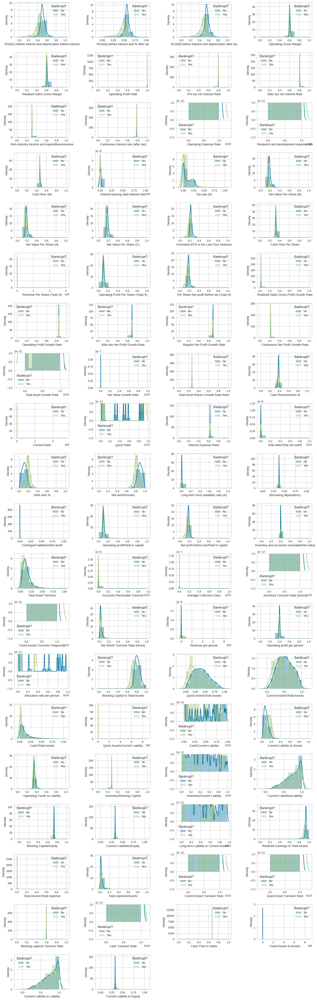

In [ ]:
data_grouped = data.groupby(by='Bankrupt?')
fig, axs = plt.subplots(nrows=20, ncols=4, figsize=(16,50))
titles = list(data.select_dtypes(exclude=['object']))

ax_title_pairs = zip(axs.flat, titles)

for ax, title in ax_title_pairs:
    sns.distplot(data_grouped.get_group('No')[title], bins=10, ax=ax,label='No')
    sns.distplot(data_grouped.get_group('Yes')[title], bins=10, ax=ax,label='Yes')
    ax.legend(title='Bankrupt?')

axs.flat[-1].remove()
axs.flat[-2].remove()
fig.tight_layout()

## Box Plots : Outlier Detection

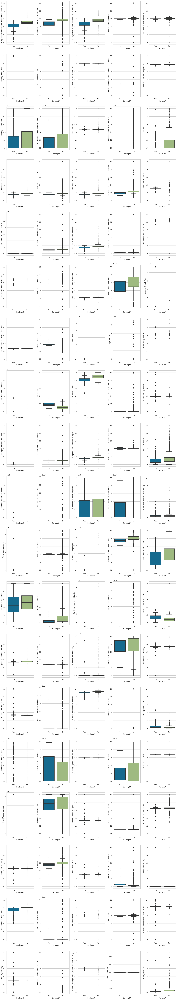

In [ ]:
fig, axs = plt.subplots(nrows=19, ncols=5, figsize=(16,90))
titles = list(data.select_dtypes(exclude=['object']))

ax_title_pairs = zip(axs.flat, titles)

for ax, title in ax_title_pairs:
    sns.boxplot(x='Bankrupt?', y=title, data=data, ax=ax)
fig.tight_layout()

In [ ]:
# Removing Outliers on train data
titles = data.select_dtypes(exclude=['object'])
for col in titles:
  Q1 = data[col].quantile(0.25)
  Q3 = data[col].quantile(0.75)
  IQR = Q3 - Q1
  Lwishker = Q1 - 1.5 * IQR
  Uwishker = Q3 + 1.5 * IQR
  data[col] = data[col].clip(Lwishker, Uwishker)

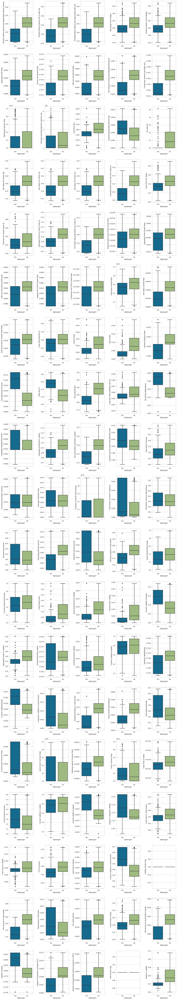

In [ ]:
fig, axs = plt.subplots(nrows=19, ncols=5, figsize=(16,90))
titles = list(data.select_dtypes(exclude=['object']))

ax_title_pairs = zip(axs.flat, titles)

for ax, title in ax_title_pairs:
    sns.boxplot(x='Bankrupt?', y=title, data=data, ax=ax)
fig.tight_layout()

# Data Pre-Processing

## Data Encoding

In [ ]:
data['Bankrupt?'] = data['Bankrupt?'].replace({'No':0, 'Yes':1})

In [ ]:
data

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.387973,0.455122,0.442034,0.601457,0.601457,0.998969,0.797096,0.809075,0.303288,0.781314,1.256969e-04,0.000000e+00,0.458143,0.000725,0.000000,0.147950,0.147950,0.147950,0.178548,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000353,0.263100,0.363725,0.002259,0.001208,0.629951,0.018673,0.207576,0.792424,0.005024,0.385425,0.006362,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,0.000117,0.032903,0.034164,0.392913,0.031370,0.672775,0.166673,0.190643,0.004094,0.001997,0.000147,0.147308,0.334015,0.276920,0.001036,0.676269,0.726190,0.338662,0.022515,0.910524,0.002022,0.064856,0.000913,6.550000e+09,0.593833,4.580000e+08,0.671568,0.424206,0.676269,0.338662,0.126365,0.637555,0.458609,0.520382,0.312905,0.068886,0.0,0.752193,0.009219,0.622879,0.601453,0.836752,0.288207,0.026608,0.564309,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.000000e+00,0.461867,0.000647,0.000000,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.631895,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,0.008781,0

## Resampling

In [ ]:
# Assign 'TARGET' column to y 
y = data['Bankrupt?'].values
# Assign all columns except 'TARGET' to X
X = data.drop(['Bankrupt?'], axis = 1).values

In [ ]:
# Check dimension
print('X shape :', X.shape)
print('y shape :', y.shape)

X shape : (6819, 95)
y shape : (6819,)


In [ ]:
# split data to train and test data
# with test size is 20% of overall data
# use stratified sampling
# and set RNG to 1000
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size = 0.2,
    stratify = y,
    random_state = 42
)

In [ ]:
# Make a new dataframe using train & test data
train_data_x = pd.DataFrame(X_train, columns=data.drop(['Bankrupt?'], axis = 1).columns)
train_data_y = pd.DataFrame(y_train, columns=['Bankrupt?'])
train_data = pd.concat([train_data_x, train_data_y], axis=1)

test_data_x = pd.DataFrame(X_test, columns=data.drop(['Bankrupt?'], axis = 1).columns)
test_data_y = pd.DataFrame(y_test, columns=['Bankrupt?'])
test_data = pd.concat([test_data_x, test_data_y], axis=1)

In [ ]:
train_data

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability,Bankrupt?
0,0.493784,0.550153,0.544622,0.598524,0.598524,0.998980,0.797443,0.809355,0.303595,0.781616,6.780000e+09,0.000000e+00,0.466210,0.000432,0.196072,0.200919,0.200919,0.200919,0.221424,0.321214,0.030507,0.097956,0.176998,0.022238,0.848256,0.690213,0.690212,0.217684,7.200000e+09,0.000456,0.264398,0.380565,0.011323,0.005382,0.630702,0.002071,0.054479,0.945521,0.005227,0.369637,0.005780,0.097652,0.175145,0.397851,0.142429,0.002082,0.003039,1.264903e-04,0.000169,0.027419,0.015863,0.392958,0.013138,0.788318,0.146419,0.291350,0.007823,0.005575,0.000846,0.048699,0.352475,0.277522,0.015190,0.813360,0.733835,0.327756,0.000000,0.932937,0.002378,0.012305,0.000913,3.780000e+09,0.593944,6.250000e+08,0.671568,0.452605,0.813360,0.327756,0.110933,0.635412,0.455924,0.586432,0.313704,0.025832,0.0,0.806631,0.001637,0.623661,0.598521,0.840649,0.276281,0.026814,0.565265,1.0,0.070742,0
1,0.534393,0.590765,0.573425,0.599302,0.599173,0.999023,0.797454,0.809359,0.303524,0.781621,3.520000e+09,0.000000e+00,0.465192,0.000321,0.255087,0.195946,0.195946,0.195946,0.249031,0.330268,0.092446,0.135412,0.206749,0.022206,0.848220,0.689580,0.689580,0.217614,1.065000e+09,0.000470,0.264301,0.383210,0.011338,0.009921,0.630861,0.010805,0.160474,0.839526,0.005774,0.375230,0.006362,0.135424,0.205822,0.414694,0.327586,0.000866,0.007305,4.209339e-04,0.001297,0

In [ ]:
test_data

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability,Bankrupt?
0,0.503242,0.556149,0.552278,0.609399,0.609399,0.999043,0.797445,0.809349,0.303466,0.781609,1.792366e-04,0.000000e+00,0.464137,0.000677,0.305294,0.174624,0.174624,0.174624,0.221424,0.322416,0.035573,0.108867,0.178203,0.022085,0.848011,0.689259,0.689259,0.217577,6.940000e+09,0.000461,0.263721,0.382475,0.007731,0.005948,0.631895,0.010452,0.157995,0.842005,0.005013,0.377514,0.005366,0.108848,0.177226,0.404004,0.143928,0.000745,0.008497,1.591638e-04,0.000129,0.042258,0.012881,0.395468,0.013122,0.776891,0.348043,0.425024,0.046361,0.006166,0.002393,0.102555,0.345771,0.277450,0.004395,0.613886,0.734249,0.331976,0.009540,0.934622,0.002277,0.035324,0.000114,9.710000e+09,0.593934,3.600000e+09,0.671569,0.571777,0.613886,0.331976,0.119148,0.637692,0.458428,0.590727,0.313521,0.037513,0.0,0.805667,0.000830,0.623746,0.609399,0.841004,0.282359,0.027096,0.566574,1.0,0.022839,0
1,0.485984,0.547754,0.530649,0.598812,0.598812,0.999002,0.797424,0.809331,0.303516,0.781591,5.060000e+08,5.430000e+08,0.468455,0.000478,0.404899,0.197463,0.197463,0.197463,0.220384,0.331718,0.050622,0.104877,0.177902,0.022059,0.847999,0.689180,0.689180,0.217568,6.060000e+09,0.000455,0.263271,0.393242,0.005662,0.005094,0.631828,0.005165,0.106721,0.893279,0.009253,0.374069,0.005850,0.104898,0.176910,0.399768,0.181409,0.000692,0.009132,6.827039e-04,0.008013,0

## Normalization

In [ ]:
# Check train data
train_data

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability,Bankrupt?
0,0.493784,0.550153,0.544622,0.598524,0.598524,0.998980,0.797443,0.809355,0.303595,0.781616,6.780000e+09,0.000000e+00,0.466210,0.000432,0.196072,0.200919,0.200919,0.200919,0.221424,0.321214,0.030507,0.097956,0.176998,0.022238,0.848256,0.690213,0.690212,0.217684,7.200000e+09,0.000456,0.264398,0.380565,0.011323,0.005382,0.630702,0.002071,0.054479,0.945521,0.005227,0.369637,0.005780,0.097652,0.175145,0.397851,0.142429,0.002082,0.003039,1.264903e-04,0.000169,0.027419,0.015863,0.392958,0.013138,0.788318,0.146419,0.291350,0.007823,0.005575,0.000846,0.048699,0.352475,0.277522,0.015190,0.813360,0.733835,0.327756,0.000000,0.932937,0.002378,0.012305,0.000913,3.780000e+09,0.593944,6.250000e+08,0.671568,0.452605,0.813360,0.327756,0.110933,0.635412,0.455924,0.586432,0.313704,0.025832,0.0,0.806631,0.001637,0.623661,0.598521,0.840649,0.276281,0.026814,0.565265,1.0,0.070742,0
1,0.534393,0.590765,0.573425,0.599302,0.599173,0.999023,0.797454,0.809359,0.303524,0.781621,3.520000e+09,0.000000e+00,0.465192,0.000321,0.255087,0.195946,0.195946,0.195946,0.249031,0.330268,0.092446,0.135412,0.206749,0.022206,0.848220,0.689580,0.689580,0.217614,1.065000e+09,0.000470,0.264301,0.383210,0.011338,0.009921,0.630861,0.010805,0.160474,0.839526,0.005774,0.375230,0.006362,0.135424,0.205822,0.414694,0.327586,0.000866,0.007305,4.209339e-04,0.001297,0

In [ ]:
# Check descriptive stats for train data
train_data.describe()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability,Bankrupt?
count,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5.455000e+03,5.455000e+03,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5.455000e+03,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5.455000e+03,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5.455000e+03,5455.000000,5.455000e+03,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.0,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.0,5455.000000,5455.000000
mean,0.504990,0.559842,0.554117,0.607790,0.607764,0.999027,0.797466,0.809376,0.303526,0.781636,1.976956e+09,1.927346e+09,0.466600,0.000380,0.111396,0.187742,0.187734,0.187761,0.22

In [ ]:
# Check test data
test_data

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability,Bankrupt?
0,0.503242,0.556149,0.552278,0.609399,0.609399,0.999043,0.797445,0.809349,0.303466,0.781609,1.792366e-04,0.000000e+00,0.464137,0.000677,0.305294,0.174624,0.174624,0.174624,0.221424,0.322416,0.035573,0.108867,0.178203,0.022085,0.848011,0.689259,0.689259,0.217577,6.940000e+09,0.000461,0.263721,0.382475,0.007731,0.005948,0.631895,0.010452,0.157995,0.842005,0.005013,0.377514,0.005366,0.108848,0.177226,0.404004,0.143928,0.000745,0.008497,1.591638e-04,0.000129,0.042258,0.012881,0.395468,0.013122,0.776891,0.348043,0.425024,0.046361,0.006166,0.002393,0.102555,0.345771,0.277450,0.004395,0.613886,0.734249,0.331976,0.009540,0.934622,0.002277,0.035324,0.000114,9.710000e+09,0.593934,3.600000e+09,0.671569,0.571777,0.613886,0.331976,0.119148,0.637692,0.458428,0.590727,0.313521,0.037513,0.0,0.805667,0.000830,0.623746,0.609399,0.841004,0.282359,0.027096,0.566574,1.0,0.022839,0
1,0.485984,0.547754,0.530649,0.598812,0.598812,0.999002,0.797424,0.809331,0.303516,0.781591,5.060000e+08,5.430000e+08,0.468455,0.000478,0.404899,0.197463,0.197463,0.197463,0.220384,0.331718,0.050622,0.104877,0.177902,0.022059,0.847999,0.689180,0.689180,0.217568,6.060000e+09,0.000455,0.263271,0.393242,0.005662,0.005094,0.631828,0.005165,0.106721,0.893279,0.009253,0.374069,0.005850,0.104898,0.176910,0.399768,0.181409,0.000692,0.009132,6.827039e-04,0.008013,0

In [ ]:
# Check descriptive stats for test data
test_data.describe()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability,Bankrupt?
count,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1.364000e+03,1.364000e+03,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1.364000e+03,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1.364000e+03,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1.364000e+03,1364.000000,1.364000e+03,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.0,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.000000,1364.0,1364.000000,1364.000000
mean,0.508375,0.563170,0.556983,0.608010,0.608003,0.999031,0.797475,0.809383,0.303528,0.781643,2.068898e+09,1.951659e+09,0.466924,0.000373,0.112142,0.189573,0.189553,0.189626,0.22

In [ ]:
# Reseparate independent and dependent feature of the train-test data
X_train = train_data.drop(['Bankrupt?'], axis=1)
y_train = train_data['Bankrupt?']

X_test = test_data.drop(['Bankrupt?'], axis=1)
y_test = test_data['Bankrupt?']

# Data Modeling

## Logistics Regression

In [ ]:
# define logistic regression model
logreg = LogisticRegression(solver='liblinear')
# fit model to data
logreg.fit(X_train, y_train)
# fit prediction model to data
y_pred_logreg = logreg.predict(X_test)

In [ ]:
logreg

LogisticRegression(solver='liblinear')

## K-Nearest Neighbors

In [ ]:
# define k-nearest neighbors classifier
knn = KNeighborsClassifier(n_neighbors = 3)
# fit model to data
knn.fit(X_train, y_train)
# fit prediction model to data
y_pred_knn = knn.predict(X_test)

In [ ]:
knn

KNeighborsClassifier(n_neighbors=3)

## Decision Tree

In [ ]:
# define decision tree classifier
dtree = DecisionTreeClassifier()
# fit model to data
dtree.fit(X_train, y_train)
# fit prediction model to data
y_pred_dtree = dtree.predict(X_test)

In [ ]:
dtree

DecisionTreeClassifier()

## Random Forest

In [ ]:
# define Random Forest classifier
rf = RandomForestClassifier(n_estimators=100)
# fit model to data
rf.fit(X_train, y_train)
# fit prediction model to data
y_pred_rf = rf.predict(X_test)

In [ ]:
rf

RandomForestClassifier()

## XGBoost

In [ ]:
# fit model no training data
xgb = XGBClassifier()
# fit model to data
xgb.fit(X_train, y_train)
# fit prediction model to data
y_pred_xgb = xgb.predict(X_test)

In [ ]:
xgb

XGBClassifier()

## Modeling Comparasion

In [ ]:
models = []
models.append(("Logistic Regression",LogisticRegression(solver='liblinear')))
models.append(("Random Forest",RandomForestClassifier(n_estimators=100)))
models.append(("XGBoost",XGBClassifier()))
models.append(("KNN",KNeighborsClassifier(n_neighbors = 3)))
models.append(("Decision Tree",DecisionTreeClassifier()))

In [ ]:
from sklearn import model_selection
recall_results = []
precision_results = []
auc_results = []
f1_score = []
names = []
col = ['ML Mode','ROC-AUC','ROC-AUC Std','Recall','Recall Std','Precision','Precision Std','F1-Score','F1-Score Std']

df_results = pd.DataFrame(columns=col)

i = 0

c = list(set(X_train.columns))

for name,model in models:
    kfold = model_selection.KFold(n_splits=3)
    cv_recall_results = model_selection.cross_val_score(model,X_train[c],y_train,cv=kfold,scoring="recall")
    
    cv_precision_results = model_selection.cross_val_score(model,X_train[c],y_train,
                                                        cv=kfold,scoring="precision")
    
    cv_auc_results = model_selection.cross_val_score(model,X_train[c],y_train,
                                                   cv=kfold,scoring="roc_auc")
    
    cv_f1_results = model_selection.cross_val_score(model,X_train[c],y_train,
                                                   cv=kfold,scoring="f1")
    recall_results.append(cv_recall_results)
    precision_results.append(cv_precision_results)
    auc_results.append(cv_auc_results)
    f1_score.append(cv_f1_results)
    names.append(name)

    df_results.loc[i] = [name,
                        round(cv_auc_results.mean()*100,2),
                        round(cv_auc_results.std()*100,2),
                        round(cv_recall_results.mean()*100,2),
                        round(cv_recall_results.std()*100,2),
                        round(cv_precision_results.mean()*100,2),
                        round(cv_precision_results.std()*100,2),
                        round(cv_f1_results.mean()*100,2),
                        round(cv_f1_results.std()*100,2)]
    i += 1

In [ ]:
df_results.sort_values('F1-Score',ascending=False)

,ML Mode,ROC-AUC,ROC-AUC Std,Recall,Recall Std,Precision,Precision Std,F1-Score,F1-Score Std
2,XGBoost,93.50,2.57,21.26,7.71,56.01,10.18,30.18,8.62
4,Decision Tree,61.80,3.02,27.95,3.14,25.66,3.93,25.08,1.70
1,Random Forest,92.41,3.82,13.19,3.41,59.72,16.08,18.98,1.13
0,Logistic Regression,60.78,2.98,0.00,0.00,0.00,0.00,0.00,0.00
3,KNN,56.04,2.29,0.00,0.00,0.00,0.00,0.00,0.00


# Model Evaluation

In [ ]:
# Logistics Regression Prediction
lr_pred = logreg.predict(X_test)
lr_pred_proba = logreg.predict_proba(X_test)

# KNN Prediction
knn_pred = knn.predict(X_test)
knn_pred_proba = knn.predict_proba(X_test)

# Decision Tree Prediction
dtree_pred = dtree.predict(X_test)
dtree_pred_proba = dtree.predict_proba(X_test)

# Random Forest Prediction
rf_pred = rf.predict(X_test)
rf_pred_proba = rf.predict_proba(X_test)

# XGBoost Prediction
xgb_pred = xgb.predict(X_test)
xgb_pred_proba = xgb.predict_proba(X_test)

### Classification Report

In [ ]:
# Logistics Regression Prediction Result
pd.DataFrame(metrics.classification_report(y_test, lr_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.967742,0.0,0.967742,0.483871,0.936524
recall,1.000000,0.0,0.967742,0.500000,0.967742
f1-score,0.983607,0.0,0.967742,0.491803,0.951877
support,1320.000000,44.0,0.967742,1364.000000,1364.000000


In [ ]:
# KNN prediction result
pd.DataFrame(metrics.classification_report(y_test, knn_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.968359,0.200000,0.965543,0.584180,0.943573
recall,0.996970,0.022727,0.965543,0.509848,0.965543
f1-score,0.982456,0.040816,0.965543,0.511636,0.952081
support,1320.000000,44.000000,0.965543,1364.000000,1364.000000


In [ ]:
# Decision Tree prediction result
pd.DataFrame(metrics.classification_report(y_test, dtree_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.980931,0.358491,0.956745,0.669711,0.960852
recall,0.974242,0.431818,0.956745,0.703030,0.956745
f1-score,0.977575,0.391753,0.956745,0.684664,0.958678
support,1320.000000,44.000000,0.956745,1364.000000,1364.000000


In [ ]:
# random forest prediction result
pd.DataFrame(metrics.classification_report(y_test, rf_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.974833,0.769231,0.972874,0.872032,0.968201
recall,0.997727,0.227273,0.972874,0.612500,0.972874
f1-score,0.986148,0.350877,0.972874,0.668512,0.965655
support,1320.000000,44.000000,0.972874,1364.000000,1364.000000


In [ ]:
# XGBoost prediction result
pd.DataFrame(metrics.classification_report(y_test, xgb_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.977629,0.608696,0.971408,0.793162,0.965728
recall,0.993182,0.318182,0.971408,0.655682,0.971408
f1-score,0.985344,0.417910,0.971408,0.701627,0.967040
support,1320.000000,44.000000,0.971408,1364.000000,1364.000000


### Confusion Matrix

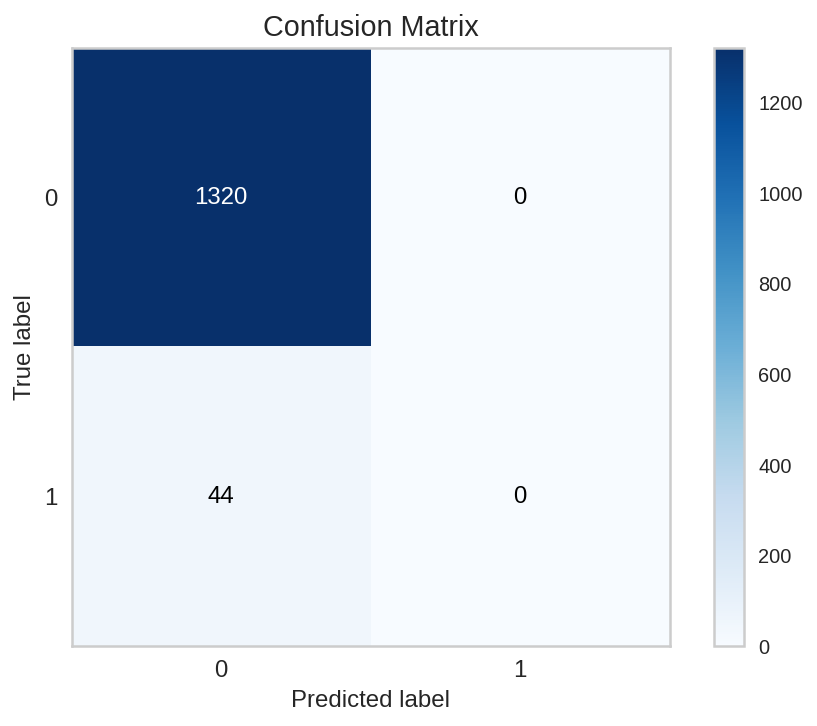

In [ ]:
# Logistic Regression result
skplt.metrics.plot_confusion_matrix(y_test, lr_pred);

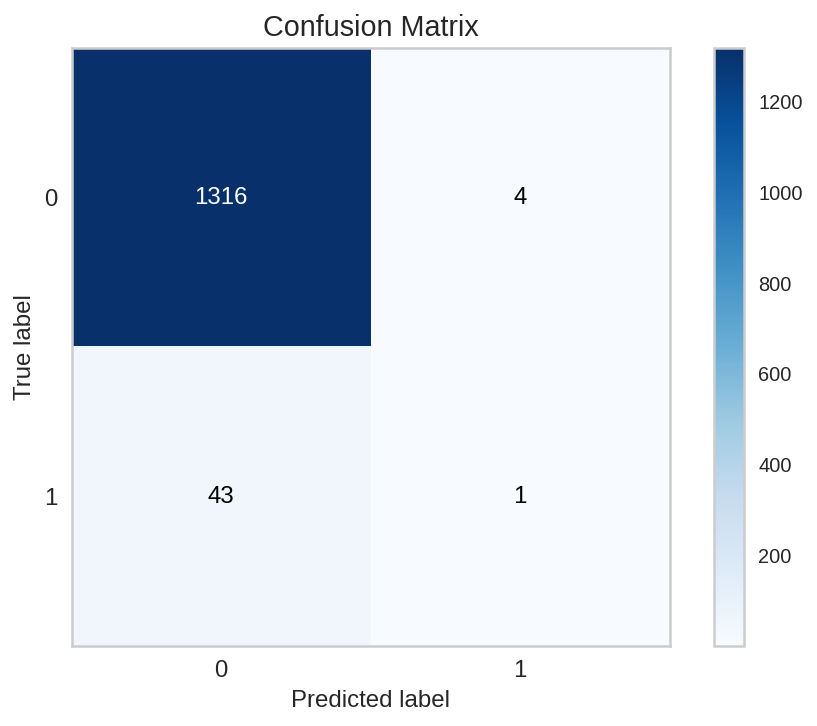

In [ ]:
# KNN result
skplt.metrics.plot_confusion_matrix(y_test, knn_pred);

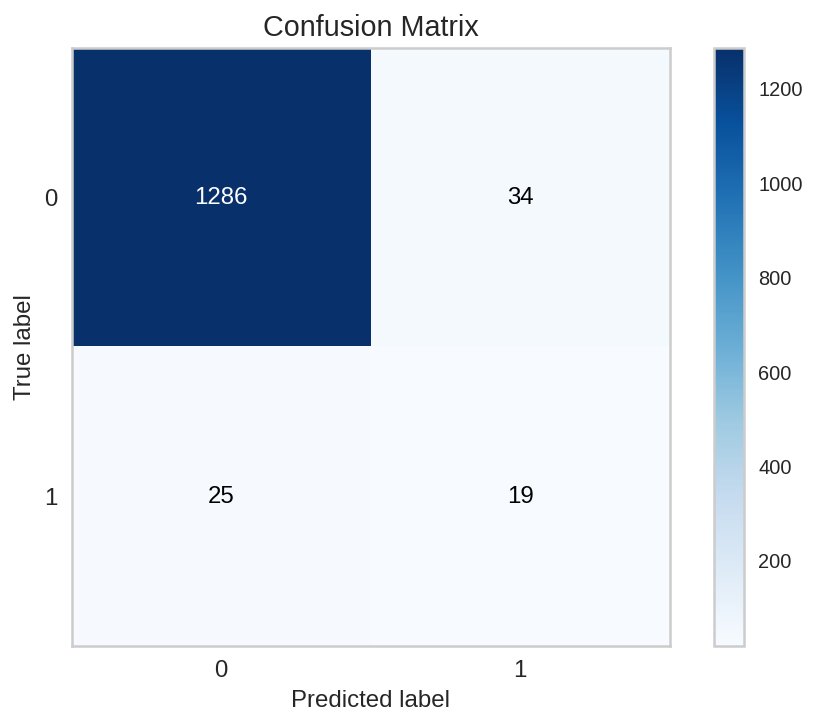

In [ ]:
# Decision Tree result
skplt.metrics.plot_confusion_matrix(y_test, dtree_pred);

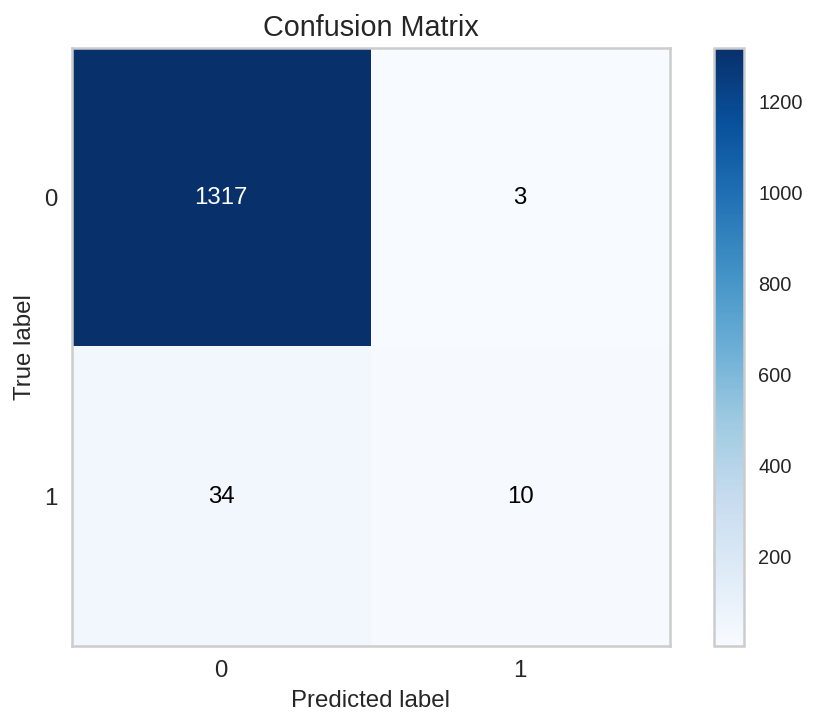

In [ ]:
# random forest result
skplt.metrics.plot_confusion_matrix(y_test, rf_pred);

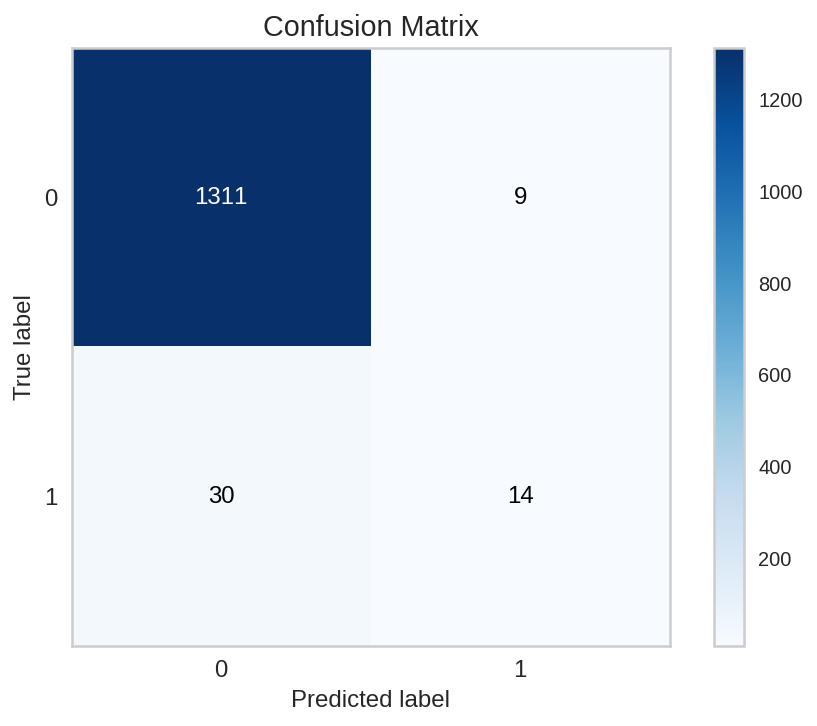

In [ ]:
# xgboost result
skplt.metrics.plot_confusion_matrix(y_test, xgb_pred);

### ROC-AUC

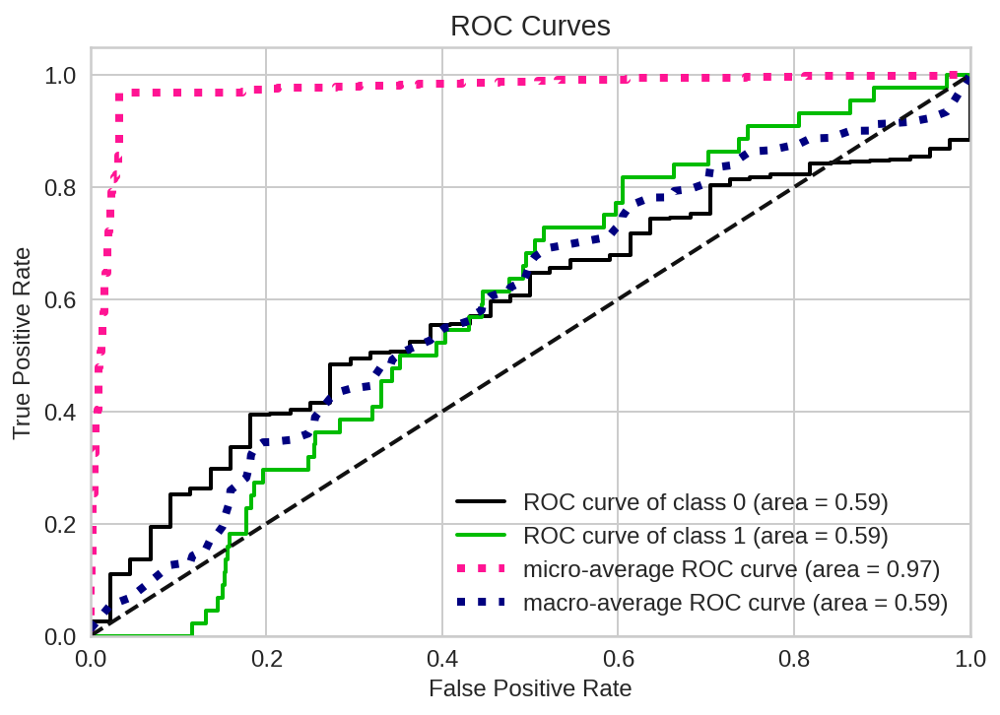

In [ ]:
# Log result
skplt.metrics.plot_roc_curve(y_test, lr_pred_proba);

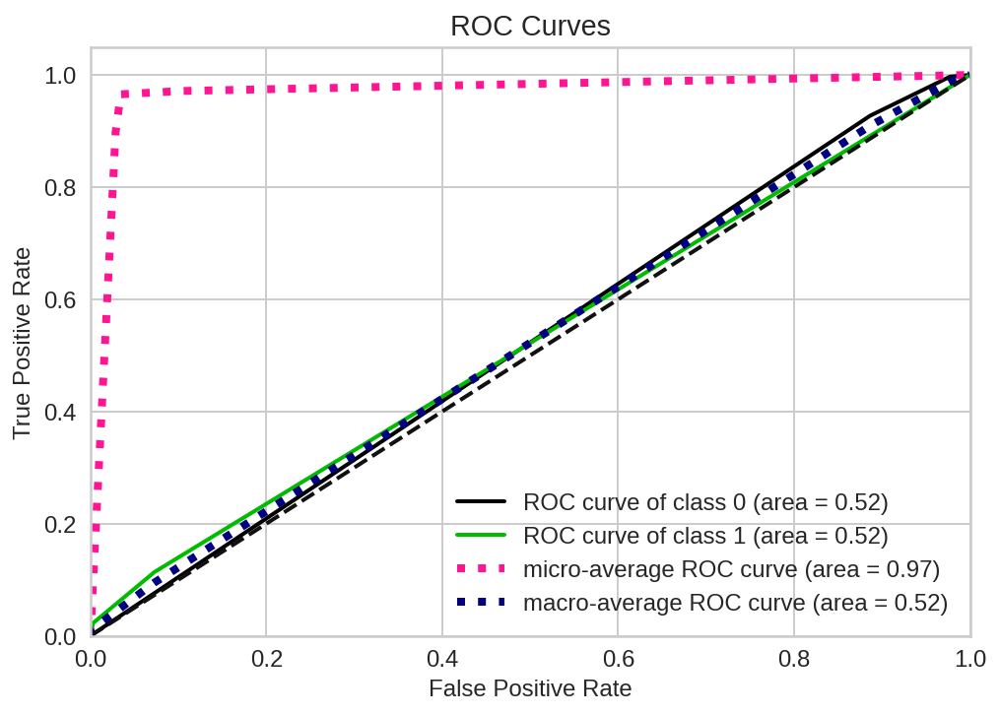

In [ ]:
# KNN result
skplt.metrics.plot_roc_curve(y_test, knn_pred_proba);

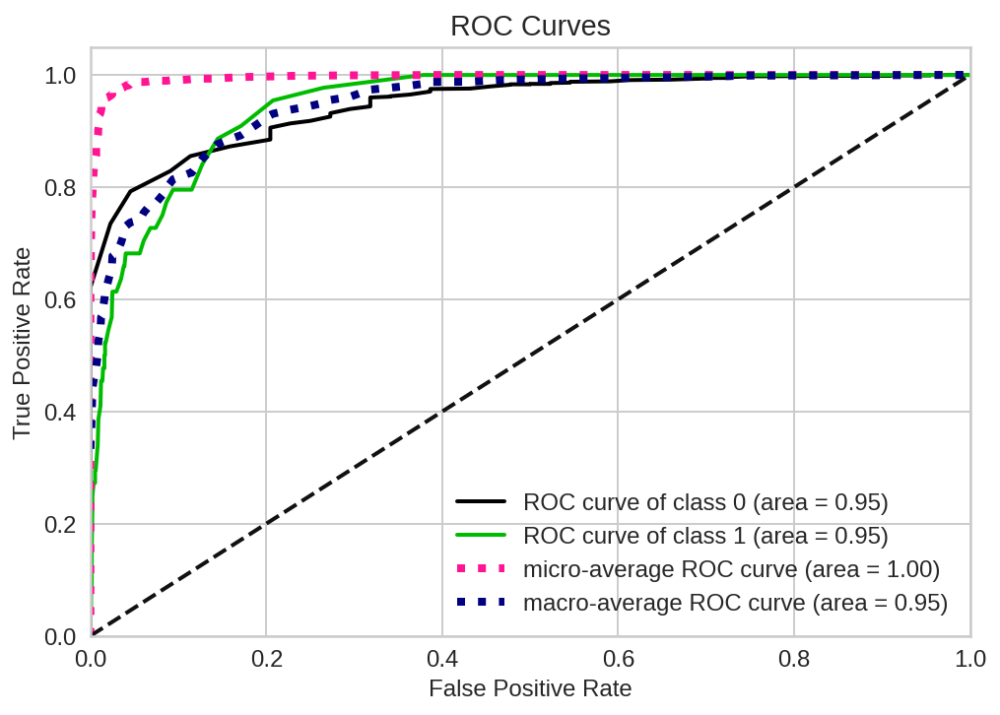

In [ ]:
# random forest result
skplt.metrics.plot_roc_curve(y_test, rf_pred_proba);

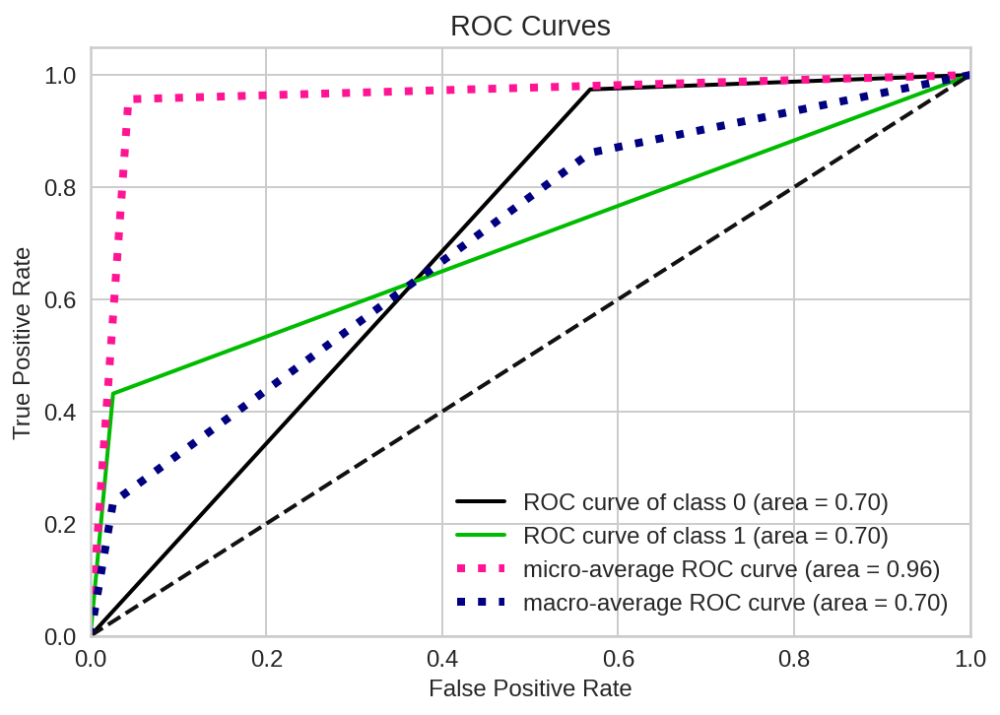

In [ ]:
# Decision Tree perceptron result
skplt.metrics.plot_roc_curve(y_test, dtree_pred_proba);

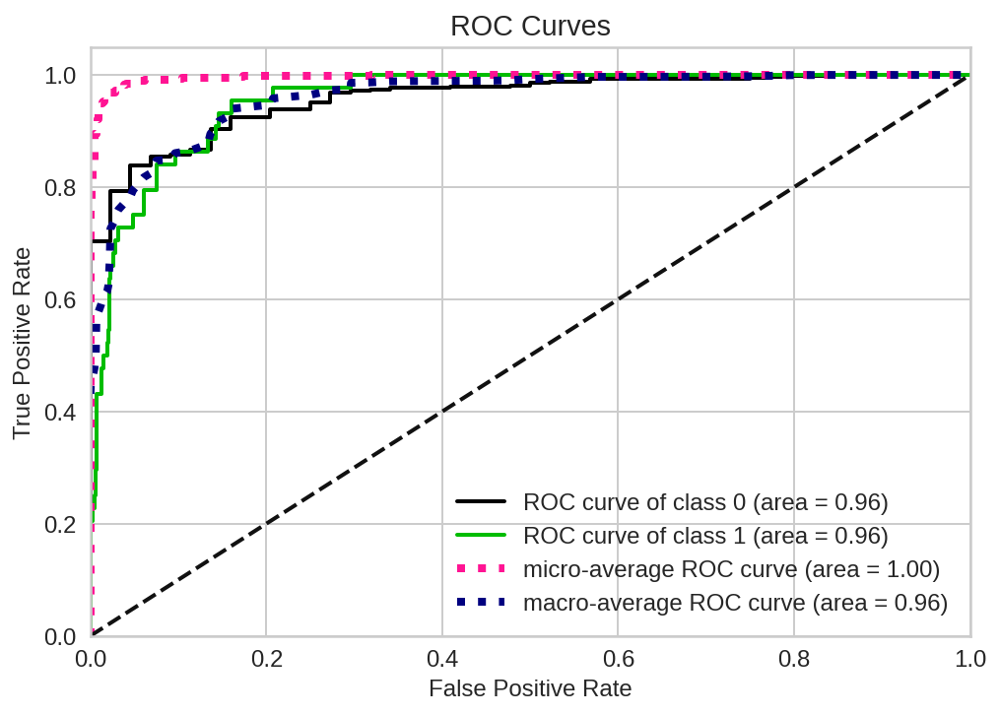

In [ ]:
# XGBoost perceptron result
skplt.metrics.plot_roc_curve(y_test, xgb_pred_proba);

### AOC Score

In [ ]:
# check LogReg f1-score
metrics.roc_auc_score(y_test, lr_pred)

0.5

In [ ]:
# check KNN f1-score
metrics.roc_auc_score(y_test, knn_pred)

0.5098484848484848

In [ ]:
# check Decision Tree f1-score
metrics.roc_auc_score(y_test, dtree_pred)

0.703030303030303

In [ ]:
# check Random Forest f1-score
metrics.roc_auc_score(y_test, rf_pred)

0.6125

In [ ]:
# check XGBoost f1-score
metrics.roc_auc_score(y_test, xgb_pred)

0.6556818181818181

### Precision

In [ ]:
# check LogReg f1-score
metrics.precision_score(y_test, lr_pred)

0.0

In [ ]:
# check KNN f1-score
metrics.precision_score(y_test, knn_pred)

0.2

In [ ]:
# check Decision Tree f1-score
metrics.precision_score(y_test, dtree_pred)

0.3584905660377358

In [ ]:
# check Random Forest f1-score
metrics.precision_score(y_test, rf_pred)

0.7692307692307693

In [ ]:
# check XGBoost f1-score
metrics.precision_score(y_test, xgb_pred)

0.6086956521739131

### Recall

In [ ]:
# check LogReg f1-score
metrics.recall_score(y_test, lr_pred)

0.0

In [ ]:
# check KNN f1-score
metrics.recall_score(y_test, knn_pred)

0.022727272727272728

In [ ]:
# check Decision Tree f1-score
metrics.recall_score(y_test, dtree_pred)

0.4318181818181818

In [ ]:
# check Random Forest f1-score
metrics.recall_score(y_test, rf_pred)

0.22727272727272727

In [ ]:
# check XGBoost f1-score
metrics.recall_score(y_test, xgb_pred)

0.3181818181818182

### F1-Score

In [ ]:
# check LogReg f1-score
metrics.f1_score(y_test, lr_pred)

0.0

In [ ]:
# check KNN f1-score
metrics.f1_score(y_test, knn_pred)

0.04081632653061225

In [ ]:
# check Decision Tree f1-score
metrics.f1_score(y_test, dtree_pred)

0.39175257731958757

In [ ]:
# check Random Forest f1-score
metrics.f1_score(y_test, rf_pred)

0.3508771929824561

In [ ]:
# check XGBoost f1-score
metrics.f1_score(y_test, xgb_pred)

0.41791044776119407

# Model Interpretation

### Variable Importance - Partial Dependence Plot

In [ ]:
## initiate explainer for Random Forest model
exp = dx.Explainer(xgb, X_train, y_train, label = "XGBoost Interpretation")

Preparation of a new explainer is initiated

  -> data              : 5455 rows 95 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 5455 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : XGBoost Interpretation
  -> predict function  : <function yhat_proba_default at 0x7f55359508c0> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.000164, mean = 0.0324, max = 0.94
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.637, mean = -0.000128, max = 0.93
  -> model_info        : package xgboost

A new explainer has been created!


In [90]:
# visualize permutation feature importance for XGBoost model
exp.model_parts().plot()

In [ ]:
# create partial dependence plot of XGBoost model
exp.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 95/95 [00:13<00:00,  7.00it/s]


# Business Evaluation Metrics

### Gain Cumulative Curve

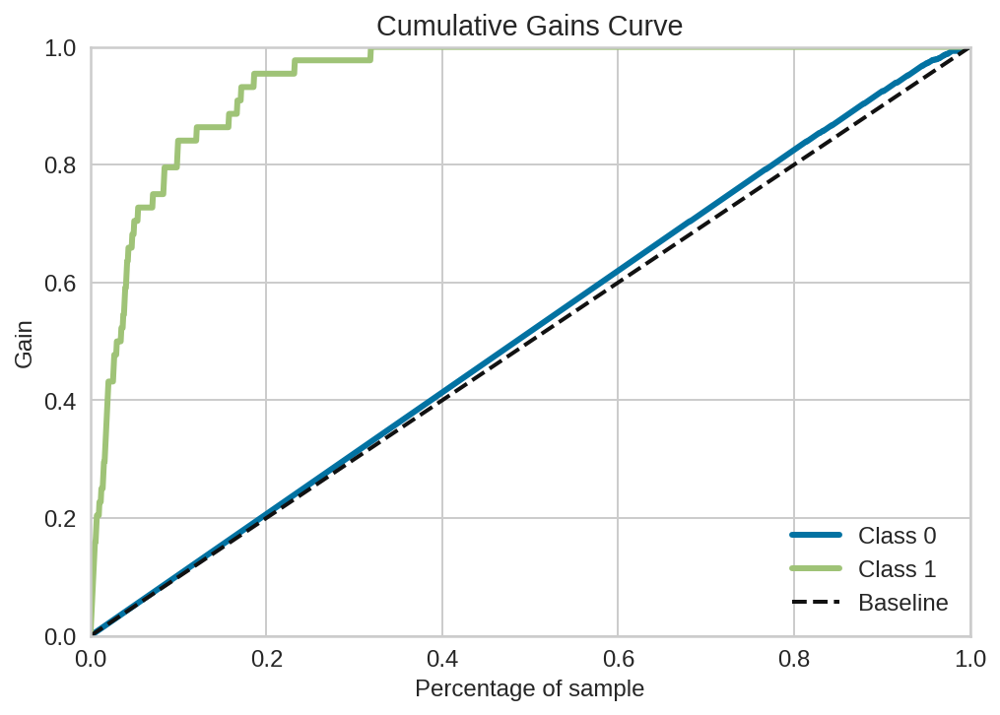

In [91]:
skplt.metrics.plot_cumulative_gain(y_test, xgb_pred_proba)

### Lift Curve

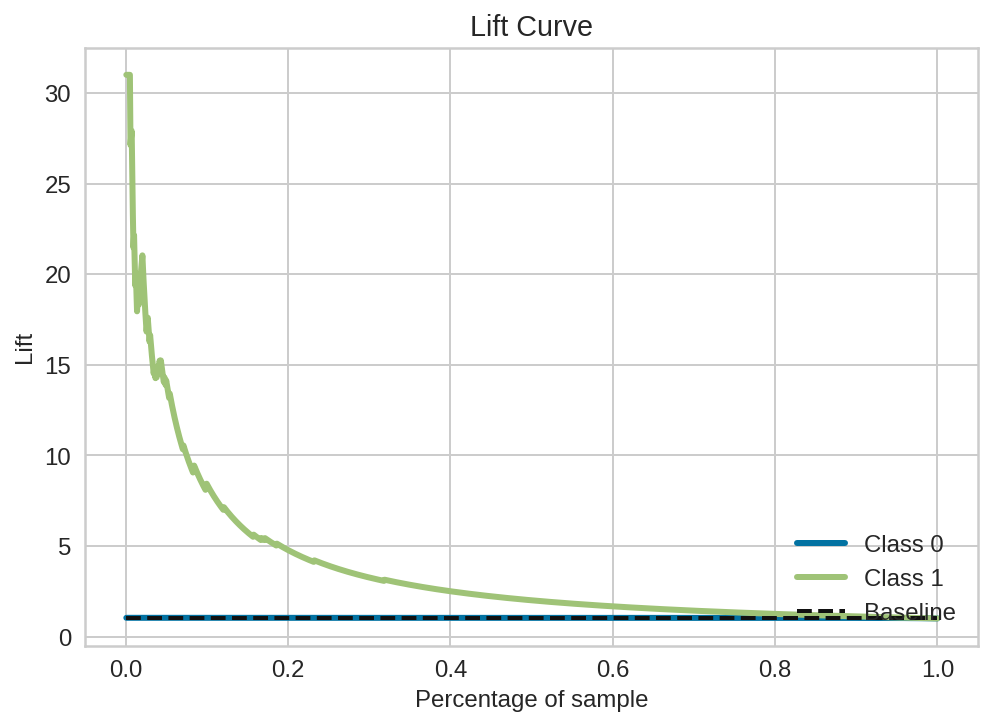

In [92]:
skplt.metrics.plot_lift_curve(y_test, xgb_pred_proba)

### Profit Curve

In [93]:
def standard_confusion_matrix(y_true, y_pred):
    '''
    Reformat confusion matrix output from sklearn for plotting profit curve.
    '''
    [[tn, fp], [fn, tp]] = metrics.confusion_matrix(y_true, y_pred)
    return np.array([[tp, fp], [fn, tn]])

def plot_profit_curve(model_object, costbenefit_mat, y_proba, y_test):
    '''
    Plot profit curve.

    INPUTS:
    - model object
    - cost benefit matrix in the same format as the confusion matrix above
    - predicted probabilities
    - actual labels
    '''

    # Profit curve data
    profits = [] # one profit value for each T (threshold)
    thresholds = sorted(y_proba, reverse=True)

    # For each threshold, calculate profit - starting with largest threshold
    for T in thresholds:
        y_pred = (y_proba > T).astype(int)
        confusion_mat = metrics.confusion_matrix(y_test, y_pred)
        # Calculate total profit for this threshold
        profit = sum(sum(confusion_mat * costbenefit_mat)) / len(y_test)
        profits.append(profit)

    print(profits)
    # Profit curve plot
    model_name = model_object.__class__.__name__
    max_profit = max(profits)
    plt.plot(np.linspace(0, 1, len(y_test)), profits, label = '{}, max profit ${:.2f} per user'.format(model_name, max_profit))


In [94]:
# create cost benefit matrix
costbenefit_mat = np.array([[0, -10000],
                            [0, 30000 - 10000]])

In [95]:
# check cost benefit matrix
costbenefit_mat

array([[     0, -10000],
       [     0,  20000]])

In [96]:
# check model confusion matrix
metrics.confusion_matrix(y_test, xgb_pred)

array([[1311,    9],
       [  30,   14]])

In [97]:
# XGBoost
xgb = XGBClassifier()

# xgb_params
xgb_params = {
    'n_estimators': [10, 50, 100],
    'max_depth': [3,5,10,'None'],
    'learning_rate': [0.1, 0.05, 0.01],
    'grow_policy': ['depthwise', 'lossguide']
}

# define model with GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb, 
    param_grid=xgb_params, 
    n_jobs=1, 
    verbose=1,
    cv = 5,
    scoring = "f1"
)

# fitting gridsearch
grid_search.fit(X_train, y_train)

# check the best estimator
grid_search.best_estimator_

Fitting 5 folds for each of 72 candidates, totalling 360 fits


XGBClassifier(grow_policy='depthwise')

In [98]:
# assign the best estimator to new variable
tree_best = grid_search.best_estimator_

[0.0, 14.662756598240469, 29.325513196480937, 43.988269794721404, 58.651026392961874, 73.31378299120234, 87.97653958944281, 102.63929618768329, 95.30791788856305, 109.97067448680352, 124.633431085044, 117.30205278592375, 109.97067448680352, 102.63929618768329, 117.30205278592375, 109.97067448680352, 102.63929618768329, 117.30205278592375, 109.97067448680352, 102.63929618768329, 117.30205278592375, 131.96480938416423, 124.633431085044, 139.29618768328444, 153.95894428152494, 168.6217008797654, 183.28445747800586, 197.94721407624633, 212.60997067448682, 205.27859237536657, 197.94721407624633, 190.6158357771261, 183.28445747800586, 175.95307917888562, 168.6217008797654, 161.29032258064515, 175.95307917888562, 190.6158357771261, 183.28445747800586, 175.95307917888562, 168.6217008797654, 183.28445747800586, 175.95307917888562, 168.6217008797654, 161.29032258064515, 153.95894428152494, 146.6275659824047, 139.29618768328444, 153.95894428152494, 146.6275659824047, 139.29618768328444, 153.95894

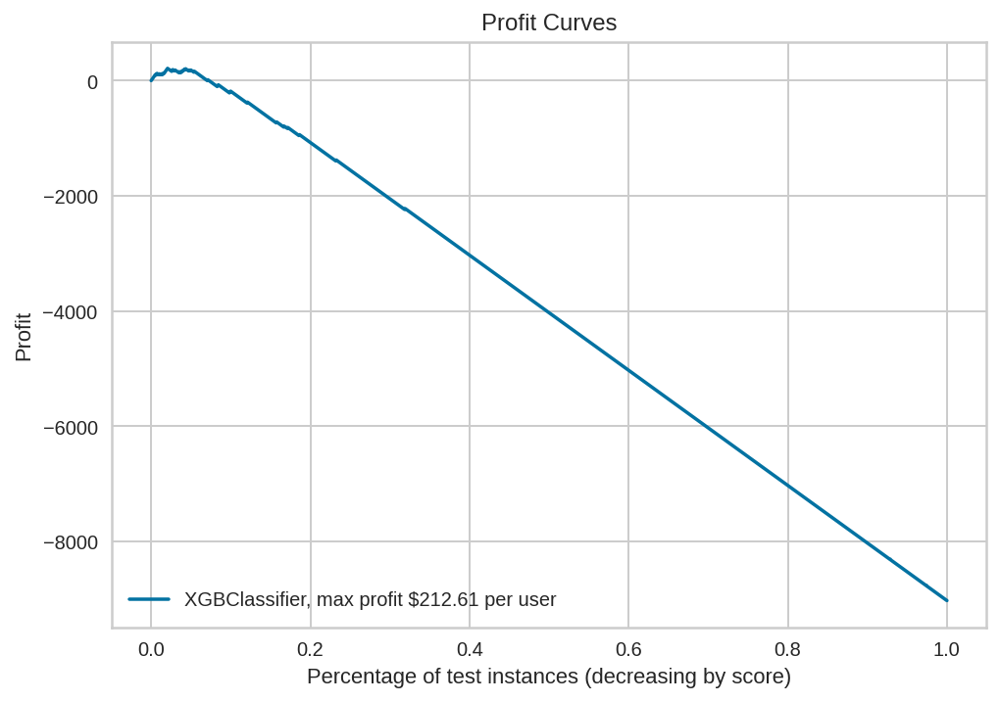

In [99]:
plot_profit_curve(tree_best,costbenefit_mat, xgb_pred_proba[:,1], y_test)
plt.xlabel('Percentage of test instances (decreasing by score)')
plt.ylabel('Profit')
plt.title('Profit Curves')
plt.legend(loc='lower left')
plt.show()